# **Traversing the US**

## [Riddler Classic, Jul 27, 2019](https://fivethirtyeight.com/features/can-you-escape-this-enchanted-maze/)

### solution by [Laurent Lessard](https://laurentlessard.com)

In [14]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import sys

### List of states and all connected pairs

In [42]:
states = ["AL", "AZ", "AR", "CA", "CO", "CT", "DE", "FL",
          "GA", "ID", "IL", "IN", "IA", "KS", "KY", "LA",
          "ME", "MD", "MA", "MI", "MN", "MS", "MO", "MT",
          "NE", "NV", "NH", "NJ", "NM", "NY", "NC", "ND",
          "OH", "OK", "OR", "PA", "RI", "SC", "SD", "TN",
          "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY"]

pairs = [('AL', 'FL'), ('AL', 'GA'), ('AL', 'MS'), ('AL', 'TN'), ('AR', 'LA'),
         ('AR', 'MO'), ('AR', 'MS'), ('AR', 'OK'), ('AR', 'TN'), ('AR', 'TX'),
         ('AZ', 'CA'), ('AZ', 'CO'), ('AZ', 'NM'), ('AZ', 'NV'), ('AZ', 'UT'),
         ('CA', 'NV'), ('CA', 'OR'), ('CO', 'KS'), ('CO', 'NE'), ('CO', 'NM'),
         ('CO', 'OK'), ('CO', 'UT'), ('CO', 'WY'), ('CT', 'MA'), ('CT', 'NY'),
         ('CT', 'RI'), ('DE', 'MD'), ('DE', 'NJ'), ('DE', 'PA'), ('FL', 'GA'),
         ('GA', 'NC'), ('GA', 'SC'), ('GA', 'TN'), ('IA', 'IL'), ('IA', 'MN'),
         ('IA', 'MO'), ('IA', 'NE'), ('IA', 'SD'), ('IA', 'WI'), ('ID', 'MT'),
         ('ID', 'NV'), ('ID', 'OR'), ('ID', 'UT'), ('ID', 'WA'), ('ID', 'WY'),
         ('IL', 'IN'), ('IL', 'KY'), ('IL', 'MO'), ('IL', 'WI'), ('IN', 'KY'),
         ('IN', 'MI'), ('IN', 'OH'), ('KS', 'MO'), ('KS', 'NE'), ('KS', 'OK'),
         ('KY', 'MO'), ('KY', 'OH'), ('KY', 'TN'), ('KY', 'VA'), ('KY', 'WV'),
         ('LA', 'MS'), ('LA', 'TX'), ('MA', 'NH'), ('MA', 'NY'), ('MA', 'RI'),
         ('MA', 'VT'), ('MD', 'PA'), ('MD', 'VA'), ('MD', 'WV'), ('ME', 'NH'),
         ('MI', 'OH'), ('MI', 'WI'), ('MN', 'ND'), ('MN', 'SD'), ('MN', 'WI'),
         ('MO', 'NE'), ('MO', 'OK'), ('MO', 'TN'), ('MS', 'TN'), ('MT', 'ND'),
         ('MT', 'SD'), ('MT', 'WY'), ('NC', 'SC'), ('NC', 'TN'), ('NC', 'VA'),
         ('ND', 'SD'), ('NE', 'SD'), ('NE', 'WY'), ('NH', 'VT'), ('NJ', 'NY'),
         ('NJ', 'PA'), ('NM', 'OK'), ('NM', 'TX'), ('NM', 'UT'), ('NV', 'OR'),
         ('NV', 'UT'), ('NY', 'PA'), ('NY', 'VT'), ('OH', 'PA'), ('OH', 'WV'),
         ('OK', 'TX'), ('OR', 'WA'), ('PA', 'WV'), ('SD', 'WY'), ('TN', 'VA'),
         ('UT', 'WY'), ('VA', 'WV')]

# smaller graph!

states2 =  ['ME','NH','VT','MA','RI','CT','NY']
states2 =  ['WA', 'OR', 'ID', 'NV', 'CA', 'AZ', 'UT']
states2 = states
pairs2 = [(i,j) for i,j in pairs if (i in states2) and (j in states2)] + [(j,i) for i,j in pairs if (i in states2) and (j in states2)]

In [69]:
# define the graph
G=nx.Graph()
G.add_nodes_from(states)
G.add_edges_from(pairs)

In [67]:
# function that plots the graph nicely and colors some of the nodes/edges.
def plotgraph( gnodes=[], gedges=[], savefile=True, label=0 ):
    # fetch kk layout
    layout = nx.kamada_kawai_layout(G)
    # rotate layout (in counterclockwise direction)
    t = 200 * np.pi/180
    R = np.array( [[np.cos(t), -np.sin(t)],[np.sin(t), np.cos(t)]] )
    xvals,yvals = [],[]
    for s in states:
        layout[s] = np.dot(R,layout[s])
        xvals.append( layout[s][0] )
        yvals.append( layout[s][1] )
    
    ncolors = []
    for n in G.nodes:
        if n in gnodes:
            ncolors.append('C2')  # SPECIAL COLOR
        else:
            ncolors.append('C0')  # DEFAULT COLOR
    
    ecolors = []
    for e in G.edges:
        if e in gedges or e[::-1] in gedges:
            ecolors.append('C2')
        else:
            ecolors.append('lightgray')
    

    plt.figure(figsize=(11,4.5))
    nx.draw(G, pos=layout, with_labels=True, node_size=700, node_shape='o',
               node_color=ncolors, edge_color=ecolors, width=2.5, font_color='white')

    # put tight padding border
    padding = 0.05
    plt.gca().set_axis_off()
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.axis( [min(xvals)-padding, max(xvals)+padding, min(yvals)-padding, max(yvals)+padding] )
    plt.tight_layout(pad=0)
    
    if savefile:
        plt.savefig("us_traverse_" + str(label).zfill(4) + ".png", bbox_inches='tight', pad_inches=0)

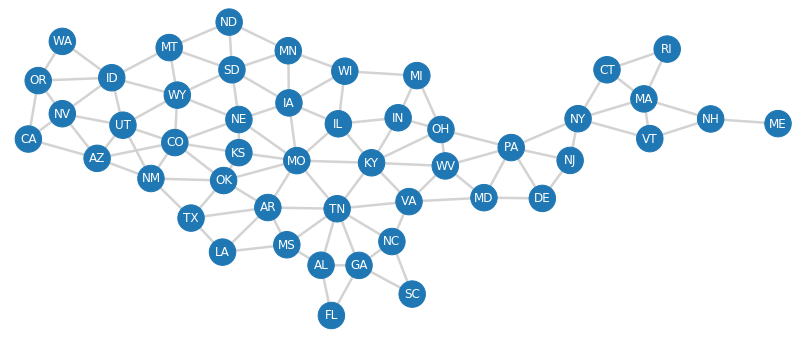

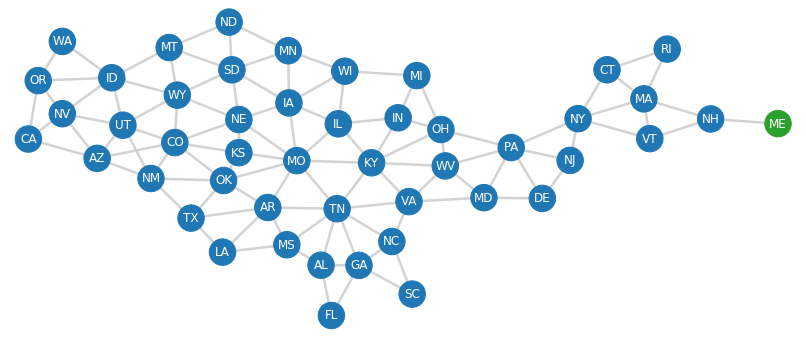

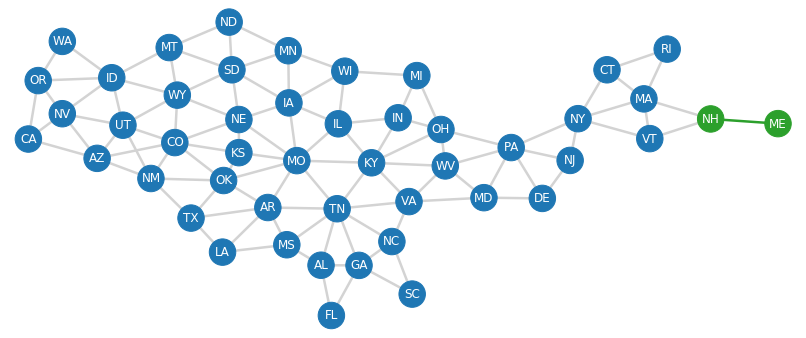

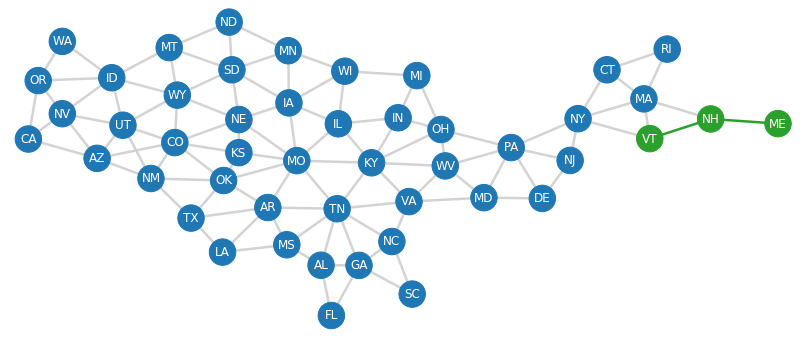

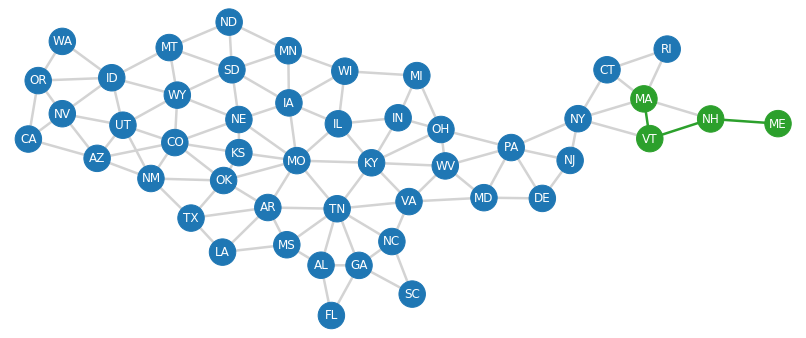

...

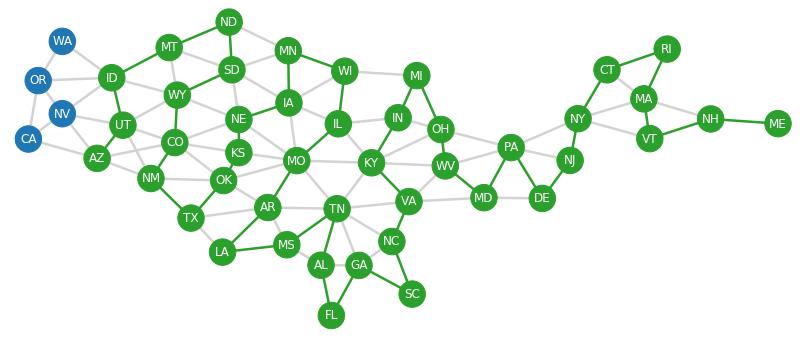

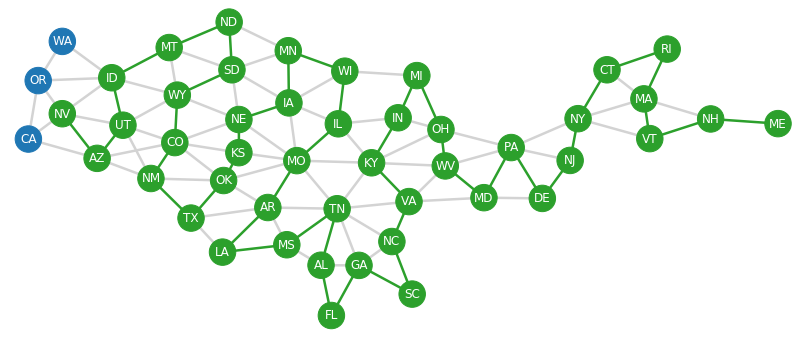

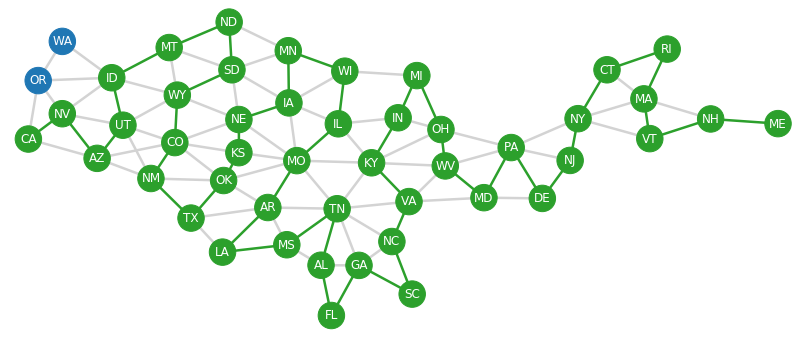

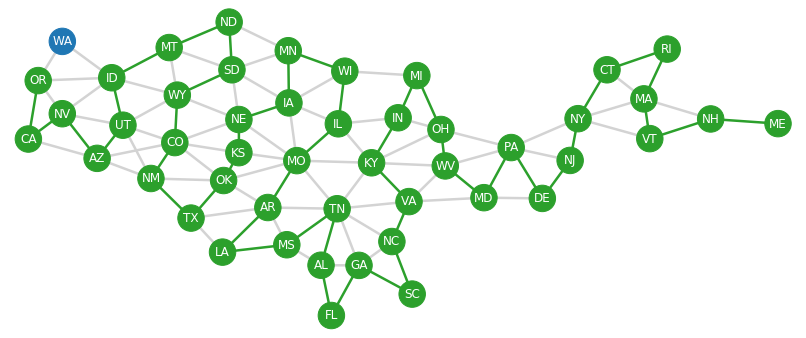

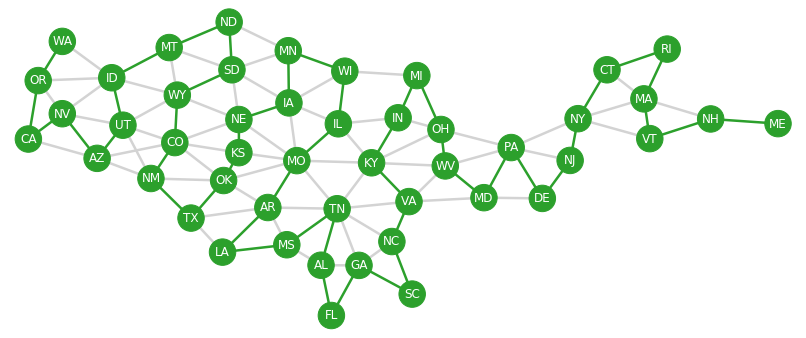

In [247]:
# Here is the order I picked. There are many solutions!
nord = ['ME','NH','VT','MA','RI','CT','NY','NJ',
        'DE','PA','MD','WV','OH','MI','IN','KY',
        'VA','NC','SC','GA','FL','AL','TN','MS',
        'LA','AR','MO','IL','WI','MN','IA','NE',
        'KS','OK','TX','NM','CO','WY','SD','ND',
        'MT','ID','UT','AZ','NV','CA','OR','WA']
n = len(nord)

eord = [ (nord[i-1],nord[i]) for i in range(1,n) ]
plotgraph(label=0)
plotgraph(gnodes=nord[0:1],label=1)
for i in range(1,n):
    plotgraph(gnodes=nord[0:i+1],gedges=eord[0:i],label=i+1)

Here is the result once the images generated above are assembled into a GIF:

![](./us_traverse_img/us_traverse.gif)

## A harder problem: longest possible path

In [44]:
from itertools import combinations
from gurobipy import *

In [45]:
V = pairs2
s = ('source',)
t = ('target',)
Vhat = V + [s,t]

E = set()
Ehat = set()
for u in V:
    for v in V:
        if v != u:
            if u[1] == v[0]:
                E.add( (u,v) )
                Ehat.add( (u,v) )

for v in V:
    Ehat.add( (s,v) )
    Ehat.add( (v,t) )
    
def edgeweight(u,v):
    if (u==s) or (v==t):
        return 0
    if (u,v) in E:
        return 1
    return -1000

L = { u+v : edgeweight(u,v) for u in Vhat for v in Vhat }

In [4]:
# define the dual graph (each node of the new graph is an edge of the old one)

V = pairs2

GG=nx.Graph()
GG.add_nodes_from(V)
for u,v in combinations(V,2):
    if (set(u) & set(v)):
        GG.add_edge(u,v)
        
# add dummy node that connects to all other nodes
s = ('source',)
t = ('target',)
GG.add_node( s )
GG.add_node( t )
for v in V:
    GG.add_edge(s,v)
    GG.add_edge(v,t)
Ehat = GG.edges
E = [e for e in Ehat if (s not in e) and (t not in e)]
Vhat = V + [s,t]  # all the nodes


def edgeweight(u,v):
    if (u==v) or (u==s) or (v==s) or (u==t) or (v==t):
        return 0
    if GG.has_edge(u,v):
        return 1
    return -1000

L = { u+v : edgeweight(u,v) for u in Vhat for v in Vhat }

In [74]:
m = Model("TSP_MTZ")

n = len(Vhat)
W = len(Vhat)/2

x = m.addVars( Vhat, Vhat, vtype=GRB.BINARY, name='x')
y = m.addVars( Vhat, lb=0, name='y')

m.addConstrs( quicksum(x[u+v]+x[u[::-1]+v] for v in Vhat) <= 1 for u in V )
m.addConstrs( quicksum(x[v+u]+x[v+u[::-1]] for v in Vhat) <= 1 for u in V )
m.addConstrs( quicksum(x[u+v] for v in Vhat) == quicksum(x[v+u] for v in Vhat) for u in V )
m.addConstr(  quicksum(x[s+v] for v in Vhat) == 1 )
m.addConstr(  quicksum(x[v+t] for v in Vhat) == 1 )
m.addConstrs( x[v+v] == 0 for v in Vhat )

m.addConstr( y[s] == 0 )
m.addConstr( y[('ME','NH')] == 1)
m.addConstrs( y[v]-y[u] >= 1 + (x[u+v]-1)*W for u in Vhat for v in Vhat )
m.addConstrs( y[v] <= W*quicksum(x[u+v] for u in Vhat) for v in V )

m.setObjective( quicksum(x[p+q]*L[p+q] for p in V for q in V), GRB.MAXIMIZE)

In [75]:
%time m.optimize()

Optimize a model with 47732 rows, 46872 columns and 463540 nonzeros
Variable types: 216 continuous, 46656 integer (46656 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+03]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+02]
Presolve removed 1085 rows and 653 columns
Presolve time: 3.47s
Presolved: 46647 rows, 46219 columns, 365895 nonzeros
Variable types: 214 continuous, 46005 integer (46004 binary)
Found heuristic solution: objective -0.0000000

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0800000e+02   3.458500e+03   0.000000e+00      7s
    1466    1.0600000e+02   0.000000e+00   0.000000e+00      7s

Root relaxation: objective 1.060000e+02, 1466 iterations, 0.71 seconds

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0  106.00000    0   82   -0.00000  1

In [31]:
logfile = open('cb.log', 'w')

setParam('OutputFlag', 0)
setParam('Heuristics', 0)

# Pass data into my callback function

m._lastiter = -GRB.INFINITY
m._lastnode = -GRB.INFINITY
m._logfile = logfile
m._vars = m.getVars()

In [ ]:
%time m.optimize(mycallback)

0 0 0 -1e+100 860 0 0
100 85 36677 -1e+100 107 0 8
200 183 39700 -1e+100 107 0 8
300 279 43493 -1e+100 107 0 8


IndexError: list index out of range

Exception ignored in: 'gurobipy.callbackstub'
Traceback (most recent call last):
  File "callback.pxi", line 183, in gurobipy.CallbackClass.callback
  File "<ipython-input-29-15bc9c07d025>", line 53, in mycallback
IndexError: list index out of range


400 350 50433 -895 107 1 37
500 432 60568 -895 107 1 37
600 535 65648 -895 107 1 44
700 535 66788 -895 107 1 44


IndexError: list index out of range

Exception ignored in: 'gurobipy.callbackstub'
Traceback (most recent call last):
  File "callback.pxi", line 183, in gurobipy.CallbackClass.callback
  File "<ipython-input-29-15bc9c07d025>", line 53, in mycallback
IndexError: list index out of range


800 721 100807 -895 107 1 44
900 745 127263 -895 107 1 44
1000 829 144167 -895 107 1 44
1100 904 151588 -895 107 1 44
1200 963 158649 -895 107 1 44
1300 985 159656 -895 107 1 44
1400 1049 160407 -895 107 1 44
1500 1096 175069 -895 107 1 44
1600 1130 185334 -895 107 1 44
1700 1191 186279 -895 107 1 44
1800 1157 186905 -895 107 1 44
1900 1270 187879 -895 107 1 44
2000 1384 189014 -895 107 1 44
2100 1350 190013 -895 107 1 44
2200 1481 190936 -895 107 1 44
2300 1531 193142 -895 107 1 44
2400 1589 204450 -895 107 1 44
2500 1653 227021 -895 107 1 44
2600 1642 230482 -895 107 1 44
2700 1776 234817 -895 107 1 44
2800 1813 243231 -895 107 1 44
2900 1864 246928 -895 107 1 44
3000 1958 248070 -895 107 1 44
3100 2010 249974 -895 107 1 44
3200 2063 261087 -895 107 1 44
3300 2150 263452 -895 107 1 44
3400 2234 269025 -895 107 1 44
3500 2234 269920 -895 107 1 44
3600 2400 274809 -895 107 1 44
3700 2505 283947 -895 107 1 44
3800 2505 285083 -895 107 1 44
3900 2505 285844 -895 107 1 44
4000 2747 293573

In [28]:
logfile.close()

In [9]:
print( m.objVal )

-10907.0


In [76]:
print(round(m.objVal+1))
h = [(v.varName, round(v.x)) for v in m.getVars() if (v.varName[0] == 'y') and (v.x > 0)]
h.sort(key = lambda x: x[1] )
h

94


[('y[ME,NH]', 1),
 ('y[NH,MA]', 2),
 ('y[MA,RI]', 3),
 ('y[RI,CT]', 4),
 ('y[CT,NY]', 5),
 ('y[NY,VT]', 6),
 ('y[VT,MA]', 7),
 ('y[MA,NY]', 8),
 ('y[NY,NJ]', 9),
 ('y[NJ,PA]', 10),
 ('y[PA,DE]', 11),
 ('y[DE,MD]', 12),
 ('y[MD,WV]', 13),
 ('y[WV,OH]', 14),
 ('y[OH,PA]', 15),
 ('y[PA,MD]', 16),
 ('y[MD,VA]', 17),
 ('y[VA,KY]', 18),
 ('y[KY,TN]', 19),
 ('y[TN,AR]', 20),
 ('y[AR,LA]', 21),
 ('y[LA,MS]', 22),
 ('y[MS,TN]', 23),
 ('y[TN,VA]', 24),
 ('y[VA,WV]', 25),
 ('y[WV,KY]', 26),
 ('y[KY,MO]', 27),
 ('y[MO,NE]', 28),
 ('y[NE,SD]', 29),
 ('y[SD,MT]', 30),
 ('y[MT,WY]', 31),
 ('y[WY,UT]', 32),
 ('y[UT,NV]', 33),
 ('y[NV,OR]', 34),
 ('y[OR,CA]', 35),
 ('y[CA,AZ]', 36),
 ('y[AZ,NM]', 37),
 ('y[NM,OK]', 38),
 ('y[OK,AR]', 39),
 ('y[AR,MS]', 40),
 ('y[MS,AL]', 41),
 ('y[AL,FL]', 42),
 ('y[FL,GA]', 43),
 ('y[GA,TN]', 44),
 ('y[TN,AL]', 45),
 ('y[AL,GA]', 46),
 ('y[GA,SC]', 47),
 ('y[SC,NC]', 48),
 ('y[NC,TN]', 49),
 ('y[TN,MO]', 50),
 ('y[MO,AR]', 63),
 ('y[AR,TX]', 64),
 ('y[TX,OK]', 65),
 (

In [33]:
for v in m.getVars():
    if v.x > 0:
        print('%s %g' % (v.varName, v.x))

x[CT,NY,NY,VT] 1
x[CT,RI,RI,MA] 1
x[MA,VT,target] 1
x[NY,VT,VT,NH] 1
x[MA,CT,CT,NY] 1
x[NH,MA,MA,VT] 1
x[RI,MA,MA,CT] 1
x[VT,NH,NH,MA] 1
x[source,CT,RI] 1
y[CT,NY] 4
y[CT,RI] 1
y[MA,VT] 8
y[NY,VT] 5
y[MA,CT] 3
y[NH,MA] 7
y[RI,MA] 2
y[VT,NH] 6
y[target] 9


In [29]:
def mycallback(model, where):
    if where == GRB.Callback.POLLING:
        # Ignore polling callback
        pass
#     elif where == GRB.Callback.PRESOLVE:
#         # Presolve callback
#         cdels = model.cbGet(GRB.Callback.PRE_COLDEL)
#         rdels = model.cbGet(GRB.Callback.PRE_ROWDEL)
#         if cdels or rdels:
#             print('%d columns and %d rows are removed' % (cdels, rdels))
#     elif where == GRB.Callback.SIMPLEX:
#         # Simplex callback
#         itcnt = model.cbGet(GRB.Callback.SPX_ITRCNT)
#         if itcnt - model._lastiter >= 100:
#             model._lastiter = itcnt
#             obj = model.cbGet(GRB.Callback.SPX_OBJVAL)
#             ispert = model.cbGet(GRB.Callback.SPX_ISPERT)
#             pinf = model.cbGet(GRB.Callback.SPX_PRIMINF)
#             dinf = model.cbGet(GRB.Callback.SPX_DUALINF)
#             if ispert == 0:
#                 ch = ' '
#             elif ispert == 1:
#                 ch = 'S'
#             else:
#                 ch = 'P'
#             print('%d %g%s %g %g' % (int(itcnt), obj, ch, pinf, dinf))
    elif where == GRB.Callback.MIP:
        # General MIP callback
        nodecnt = model.cbGet(GRB.Callback.MIP_NODCNT)
        objbst = model.cbGet(GRB.Callback.MIP_OBJBST)
        objbnd = model.cbGet(GRB.Callback.MIP_OBJBND)
        solcnt = model.cbGet(GRB.Callback.MIP_SOLCNT)
        if nodecnt - model._lastnode >= 100:
            model._lastnode = nodecnt
            actnodes = model.cbGet(GRB.Callback.MIP_NODLFT)
            itcnt = model.cbGet(GRB.Callback.MIP_ITRCNT)
            cutcnt = model.cbGet(GRB.Callback.MIP_CUTCNT)
            print('%d %d %d %g %g %d %d' % (nodecnt, actnodes, \
                  itcnt, objbst, objbnd, solcnt, cutcnt))
        if abs(objbst - objbnd) < 0.1 * (1.0 + abs(objbst)):
            print('Stop early - 10% gap achieved')
            model.terminate()
#         if nodecnt >= 10000 and solcnt:
#             print('Stop early - 10000 nodes explored')
#             model.terminate()
    elif where == GRB.Callback.MIPSOL:
        # MIP solution callback
        nodecnt = model.cbGet(GRB.Callback.MIPSOL_NODCNT)
        obj = model.cbGet(GRB.Callback.MIPSOL_OBJ)
        solcnt = model.cbGet(GRB.Callback.MIPSOL_SOLCNT)
        x = model.cbGetSolution(model._vars)
        print('**** New solution at node %d, obj %g, sol %d, ' \
              'x[0] = %g ****' % (nodecnt, obj, solcnt, x[0]))
#     elif where == GRB.Callback.MIPNODE:
#         # MIP node callback
#         print('**** New node ****')
#         if model.cbGet(GRB.Callback.MIPNODE_STATUS) == GRB.Status.OPTIMAL:
#             x = model.cbGetNodeRel(model._vars)
#             model.cbSetSolution(model.getVars(), x)
    elif where == GRB.Callback.BARRIER:
        # Barrier callback
        itcnt = model.cbGet(GRB.Callback.BARRIER_ITRCNT)
        primobj = model.cbGet(GRB.Callback.BARRIER_PRIMOBJ)
        dualobj = model.cbGet(GRB.Callback.BARRIER_DUALOBJ)
        priminf = model.cbGet(GRB.Callback.BARRIER_PRIMINF)
        dualinf = model.cbGet(GRB.Callback.BARRIER_DUALINF)
        cmpl = model.cbGet(GRB.Callback.BARRIER_COMPL)
        print('%d %g %g %g %g %g' % (itcnt, primobj, dualobj, \
              priminf, dualinf, cmpl))
    elif where == GRB.Callback.MESSAGE:
        # Message callback
        msg = model.cbGet(GRB.Callback.MSG_STRING)
        model._logfile.write(msg)
    else:
        pass

In [77]:
edge_order = [ (q[0][2:4],q[0][5:7]) for q in h[2:-1] ]
node_order = [ q[0] for q in edge_order ] + [ edge_order[-1][1] ]

C:\Users\Laurent\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
C:\Users\Laurent\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "
C:\Users\Laurent\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


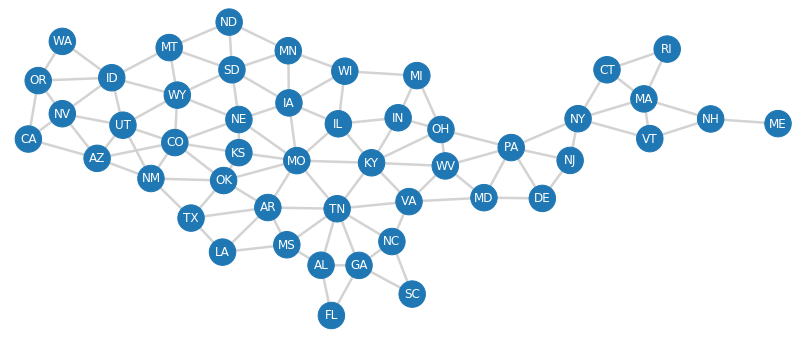

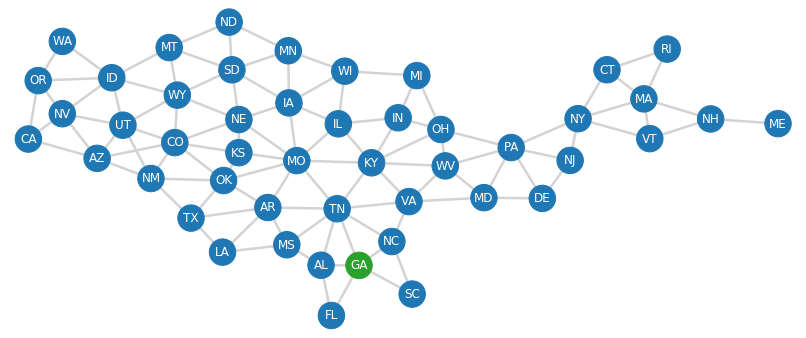

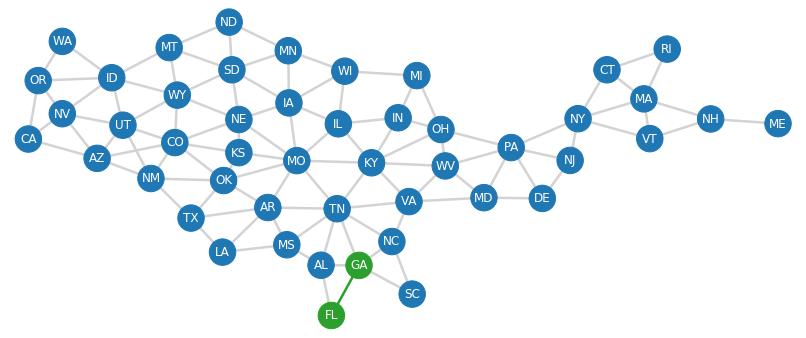

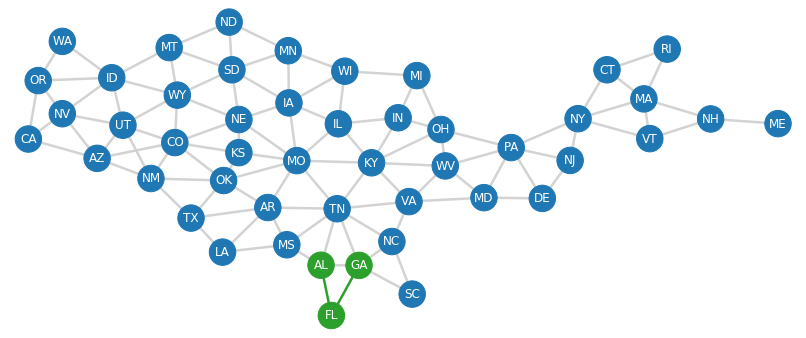

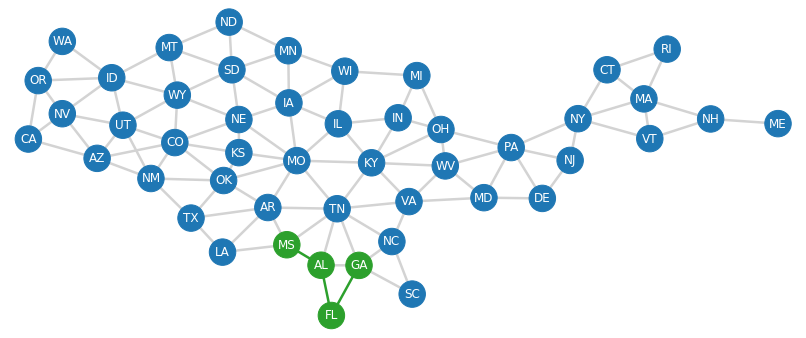

...

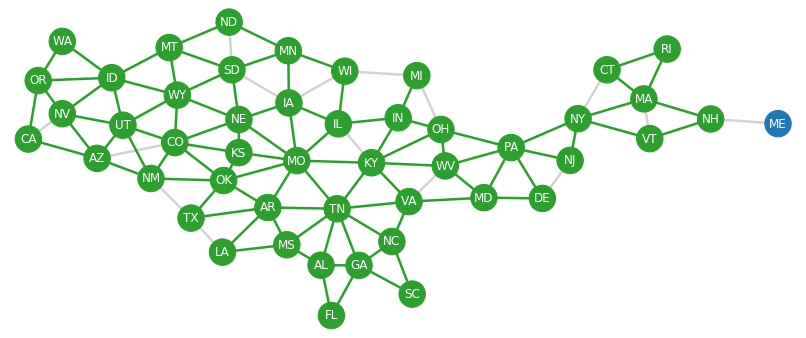

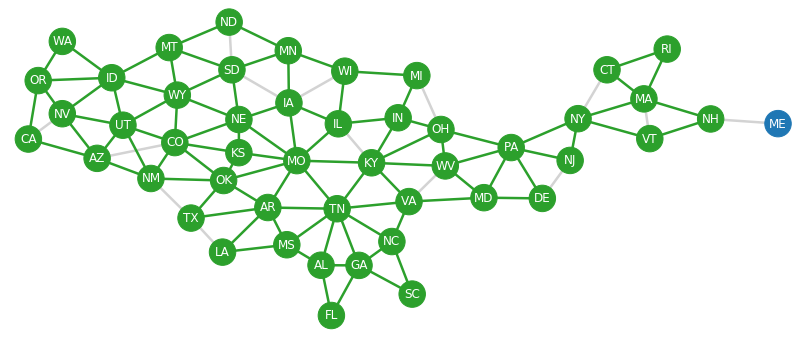

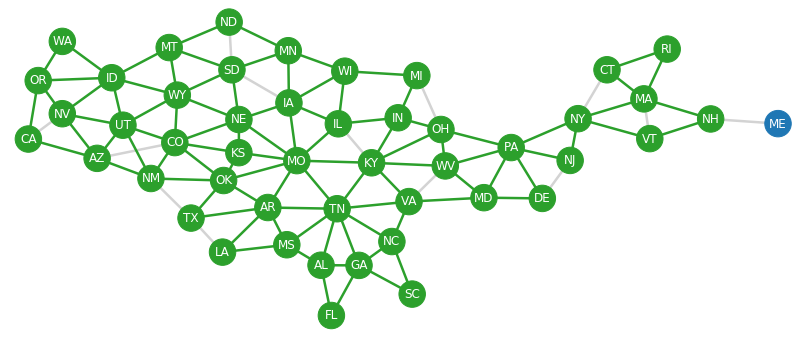

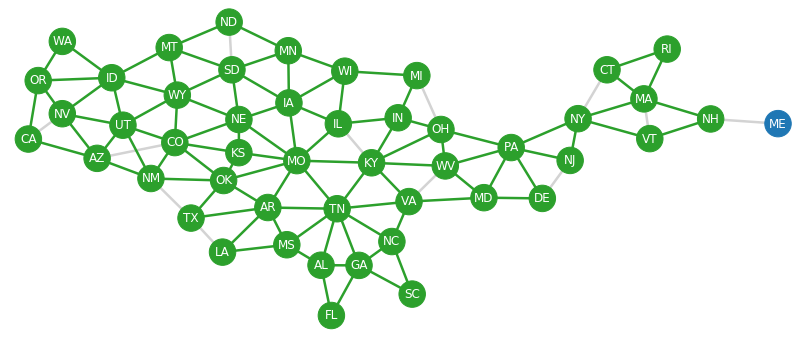

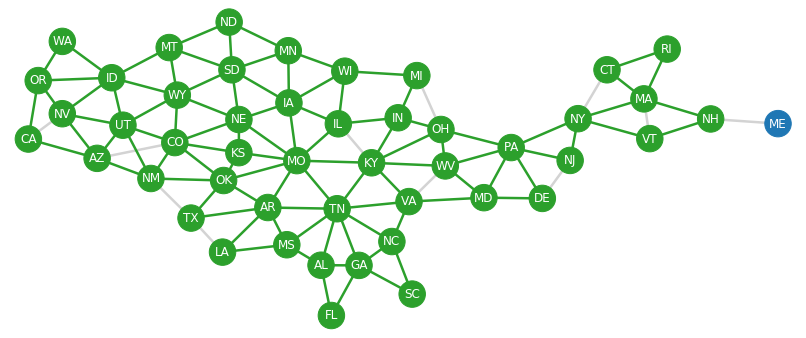

In [70]:
# Here is the order I picked. There are many solutions!
n = len(node_order)
plotgraph(label=9000)
plotgraph(gnodes=node_order[0:1],label=9001)
for i in range(1,n):
    plotgraph(gnodes=set(node_order[0:i+1]),gedges=set(edge_order[0:i]),label=9000+i+1)

In [78]:
len(set(node_order))

46